In [28]:
%pip install scipy


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: pip3.13 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [29]:
%pip install sklearn

  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> [15 lines of output]
      The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
      rather than 'sklearn' for pip commands.
      
      Here is how to fix this error in the main use cases:
      - use 'pip install scikit-learn' rather than 'pip install sklearn'
      - replace 'sklearn' by 'scikit-learn' in your pip requirements files
        (requirements.txt, setup.py, setup.cfg, Pipfile, etc ...)
      - if the 'sklearn' package is used by one of your dependencies,
        it would be great if you take some time to track which package uses
        'sklearn' instead of 'scikit-learn' and report it to their issue tracker
      - as a last resort, set the environment variable
        SKLEARN_ALLOW_DEPRECATED_SK

In [30]:
# Importamos las librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.special as special
from scipy.optimize import curve_fit
import seaborn as sns
from sklearn.metrics import r2_score

In [31]:
df = pd.read_csv('Sicily.csv')
df.head(5)

,Unnamed: 0,name,description,neighborhood_overview,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_communication.1,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,reviews_per_month
0,0,SEASIDE - Historic Antique Residence,WINEYARD WITH COLOURS OF THE SEASIDE.<br /><br...,NaN,Yumi Adriano,13/05/09,"Sicily, Italy","Hi, this is Yumi, I am a Japanese, I speak Ja...",NaN,NaN,...,4.69,4.66,4.86,4.83,4.72,4.72,4.59,10,10,0.18
1,1,BnB center near station with balcony and break...,Near the Central Station and the beginning of ...,"The neighborhood is in a residential area, cen...",Giuseppe,05/03/10,"Agrigento, Italy","Di carattere tranquillo e dinamico, sposato, c...",within an hour,100%,...,4.80,4.87,4.89,4.85,4.81,4.81,4.85,3,0,2.48
2,2,Etna-sea a panoramic villa,"Our country house, swathed in the greenery of ...","Contact with nature, relaxation, remarkable pa...",Serena,24/06/10,"Piedimonte Etneo, Italy",.,within a few hours,100%,...,4.79,4.82,4.83,4.89,4.81,4.81,4.76,5,5,0.90
3,3,Two steps from the sea,Very nice flat in front of the beach with a wo...,NaN,Gaspare,05/08/10,"Trapani, Italy",Managing parents' houses in Trapani and in San...,within an hour,100%,...,4.68,4.78,4.57,4.97,4.94,4.94,4.64,2,2,0.49
4,4,Villa Verdemare,Wonderful villa that can easily accommodate up...,NaN,Gaspare,05/08/10,"Trapani, Italy",Managing parents' houses in Trapani and in San...,within an hour,100%,...,4.85,4.82,4.69,4.99,4.92,4.92,4.72,2,2,0.46


In [32]:
df_limpio = df.dropna()

In [33]:
df_limpio.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6049 entries, 1 to 55817
Data columns (total 51 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Unnamed: 0                                   6049 non-null   int64  
 1   name                                         6049 non-null   object 
 2   description                                  6049 non-null   object 
 3   neighborhood_overview                        6049 non-null   object 
 4   host_name                                    6049 non-null   object 
 5   host_since                                   6049 non-null   object 
 6   host_location                                6049 non-null   object 
 7   host_about                                   6049 non-null   object 
 8   host_response_time                           6049 non-null   object 
 9   host_response_rate                           6049 non-null   object 
 10  host

In [34]:
# Graficamos todas las dispersiones entre todas las variables
sns.pairplot(df_limpio)

In [35]:
# Eliminar outliers usando método IQR
def remove_outliers_iqr(df_limpio, column):
    Q1 = df_limpio[column].quantile(0.25)
    Q3 = df_limpio[column].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return df_limpio[(df_limpio[column] >= lower) & (df_limpio[column] <= upper)]

In [38]:
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= df_limpio[["host_response_time"]]
Var_Dep= df_limpio["host_response_rate"]
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep
def func1(x, a, b):  
    """Función logarítmica: y = a * log(x) + b"""  
    return a * np.log(x) + b  


# Ajuste de la curva  
parametros1, covs = curve_fit(func1, df_limpio["host_response_time"], df_limpio["host_response_rate"])  


print("Parámetros ajustados:", parametros1)  

y_pred1 = func1(x, *parametros1)  

# Gráfica
plt.plot(x, y, 'bo', label="y-original")    
plt.plot(x, y_pred1, label="y-predecida con y=a*log(x)+b")  
plt.xlabel('x')  
plt.ylabel('y')  
plt.legend(loc='best', fancybox=True, shadow=True)  
plt.grid(True)  
plt.show()  

# Cálculo del coeficiente de determinación  
R2_Modelo1 = r2_score(y, y_pred1)  
print("R^2 del Modelo 1:", R2_Modelo1)  

# Cálculo de R  
R = np.sqrt(R2_Modelo1)  
print("R del Modelo 1:", R)  

ValueError: could not convert string to float: '100%'

In [ ]:
def func1(x, a, b, c):  
    """Función polinómica inversa: y = (a/b) * x^2 + c * x"""  
    return (a / b) * x**2 + c * x  


parametros1, covs = curve_fit(func1, df["host_response_time"], df["host_response_rate"])  


print("Parámetros ajustados:", parametros1)  
 
y_pred1 = func1(x, *parametros1)  

# Gráfico de los resultados  
plt.plot(x, y, 'bo', label="y-original")  
plt.plot(x, y_pred1, label="y-predecida con y=(a/b)*x^2+c*x")  
plt.xlabel('x')  
plt.ylabel('y')  
plt.legend(loc='best', fancybox=True, shadow=True)  
plt.grid(True)  
plt.show()  

# Cálculo del coeficiente de determinación 
R2_Modelo1 = r2_score(y, y_pred1)  
print("R^2 del Modelo 1:", R2_Modelo1)  

# Cálculo de R  
R = np.sqrt(R2_Modelo1)  
print("R del Modelo 1:", R) 

ValueError: array must not contain infs or NaNs

## MODELO 1

In [ ]:
def func1 (x, a, b, c):
    return a*x**2 + b*x + c

In [ ]:
# Ajustamos los parámetros de la función curve_fit
parametros1, covs= curve_fit(func1, df['ins_losses'], df['total'])

In [ ]:
# Obtenemos los coeficientes del modelo de regresión no lineal
parametros1

array([ 6.31404142e-04, -1.78288204e-01,  2.79658147e+01])

In [ ]:
# Predicciones
y_pred1 = func1(x, *parametros1)

In [ ]:
# Calculamos las predicciones y reestructuramos el vector de predicciones
y_pred1

,ins_losses
0,15.389687
1,15.413326
2,15.980397
3,15.381021
4,15.757437
5,15.381127
6,15.801567
7,15.447037
8,15.396744
9,15.385770


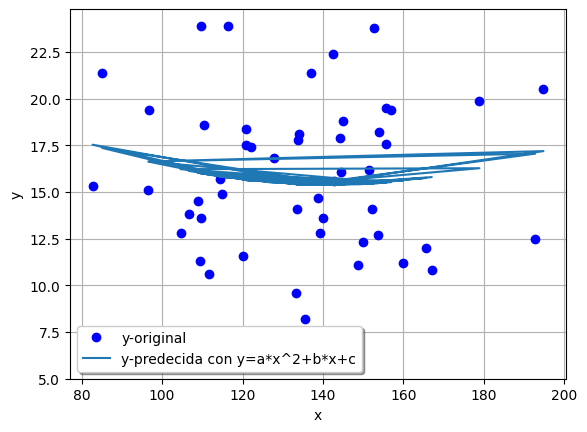

In [ ]:
# Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, y_pred1, label="y-predecida con y=a*x^2+b*x+c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2_Modelo1 = r2_score(y, y_pred1)
R2_Modelo1

0.01752847810123681

In [ ]:
# Calculamos el coeficiente de determinación del modelo
R = np.sqrt(R2_Modelo1)
R

0.13239515890408082

## MODELO 2

In [ ]:
def func2(x, a, b, c):
    return a*np.exp(-b*x)+c

In [ ]:
# Ajustamos los parámetros de la función curve_fit
parametros2, covs2= curve_fit(func2)

In [ ]:
# Obtenemos los coeficientes del modelo de regresión no lineal
parametros2

In [ ]:
# Predicciones
y_pred2 = func2(x, *parametros2)

In [ ]:
# Calculamos las predicciones y reestructuramos el vector de predicciones
y_pred2

In [ ]:
# Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, y_pred2, label="y-predecida con y=a*exp(-b*x)+c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
#Calculamos el coeficiente de determinación del modelo
R2_Modelo2 = r2_score(y, y_pred2) 
R2_Modelo2

In [ ]:
#Calculamos el coeficiente de correlación del modelo
R = np.sqrt(R2_Modelo2)
R